## Clase 03: Operaciones Elementales sobre Rasters

------

### Objetivos de esta Notebook:

1) Aprender (o mejor dicho, repasar) las operaciones básicas de lectura y visualización de archivos raster georreferenciados.  
2) Aprender a realizar operaciones básicas de procesamiento como el recorte, apilado  y el álgebra de bandas.  
3) Guardar recortes de una imagen original como archivos nuevos.  

### 1) Lectura de rasters georreferenciados

Vamos a trabajar con la imagen SPOT 7 de la ciudad de Córdoba presentada en la clase anterior. Utilizaremos la librería GDAL para abrir el archivo, y para luego escribir los resultados obtenidos. Para el tratamiento de los datos utilizaremos la estructura que nos ofrecen los arreglos de NumPy repasadas en las clases anteriores:  


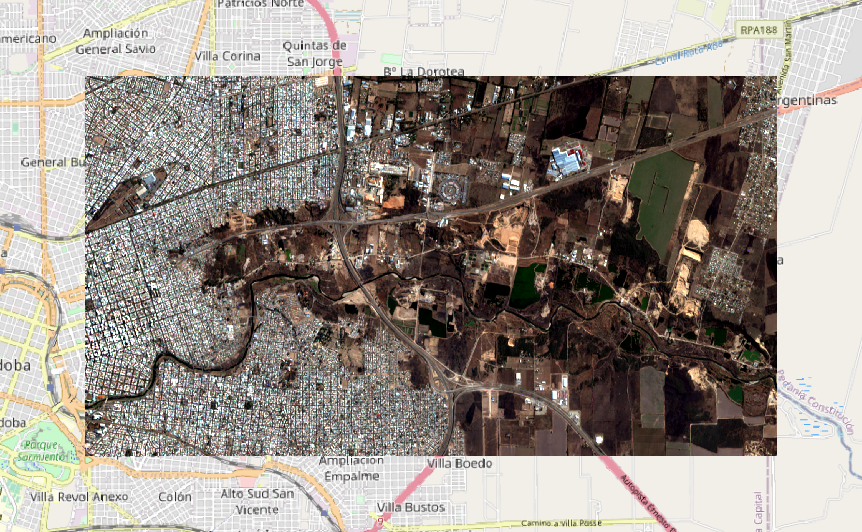

Empecemos por importar las librerías que vamos a utilizar:

In [116]:
import numpy as np
import gdal
from matplotlib import pyplot as plt

import warnings
warnings.filterwarnings('ignore')

A continuación, miremos nuestros archivos en la carpeta **Data**. Tenemos dos archivos de extensión **.tif**. Uno corresponde a la banda pancromática de nuestra SPOT, y el otro a un apilado de las 3 bandas del visible + el infrarrojo cercano (NIR) (¿qué resolucion tienen cada uno de estos productos?):  

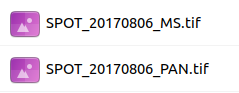    
  

También tenemos dos archivos .XML que corresponden a los metadatos que cada uno de estos productos. Los utilizaremos más tarde:  

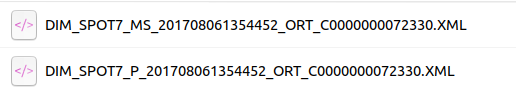  

Empezaremos por leer el archivo **SPOT_20170806_MS.tif** , que contiene las bandas R,G,B y NIR  


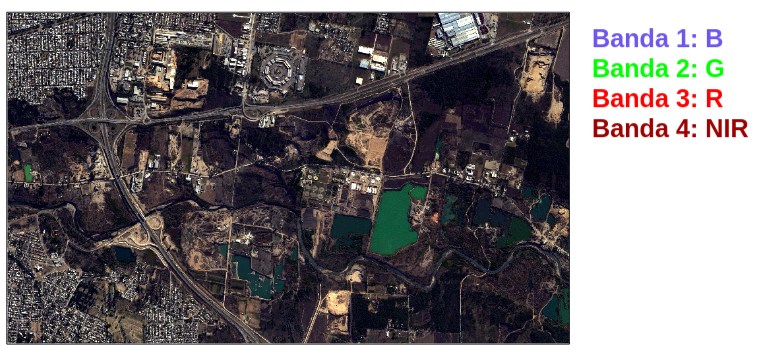

In [120]:
spot_apilada = gdal.Open('../Data/SPOT_20170806_MS.tif')

#Alternativamente, podemos usar la libreria os y la función path.join para evitarnos los problemas de notación
# de directorios entre Windows, Mac y Linux:

# import os
# spot_apilada = gdal.Open(os.path.join('../Data','SPOT_20170806_MS.tif'))

La imagen así abierta es solo un objeto de GDAL. Probá ver qué devuelve el print() sobre la variable recién creada:

In [7]:
print(spot_apilada)

<osgeo.gdal.Dataset; proxy of <Swig Object of type 'GDALDatasetShadow *' at 0x7fa5365e1150> >


No podemos hacer mucho con este objeto. Lo convertiremos a matriz de Numpy para poder manipularlo, pero antes leeremos sus parámetros GeoTransform y Projection para utilizarlos más tarde

In [121]:
gt = spot_apilada.GetGeoTransform()
src = spot_apilada.GetProjection()

#¿Qué devuelve el print() sobre estas variables?

In [122]:
spot_apilada = spot_apilada.ReadAsArray()

#### Veamos las dimensiones de esta imagen, ¿Cuántas columnas, filas y bandas tiene?

In [14]:
spot_apilada.shape

(4, 989, 1802)

#### Visualicemos alguna de las bandas con matplotlib

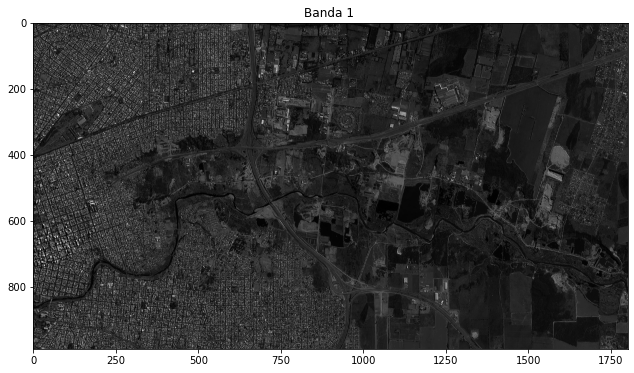

In [137]:
banda1 = spot_apilada[0,:,:]
plt.figure(figsize = (12,6))
plt.imshow(banda1, cmap = 'gray')
plt.title("Banda 1 ")
plt.show()

#### ¿Qué estamos viendo como "coordenadas de esta imagen"?

Hemos leido este archivo como _arreglo_ de Numpy. Las coordenadas que vemos son: En el eje Y, las filas, que crecen desde arriba hacia abajo; y en el eje X las columnas, cuyo índice crece de izquierda a derecha.

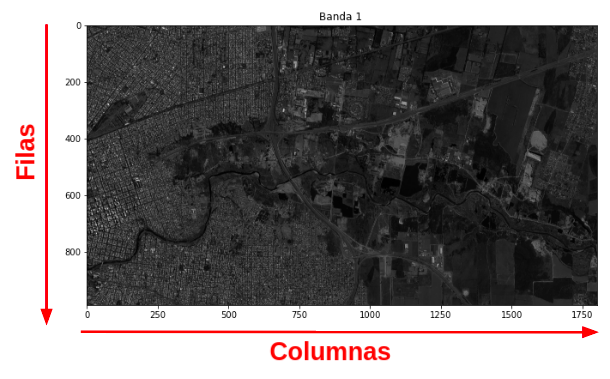


#### ¿Son estas las coordenadas geográficas de la imagen? 
NO, no lo son. En la clase 4 veremos cómo con la biblioteca rasterio las podemos abrir y visualizar sus coordenadas, pero para lo que resta en esta clase será suficiente con lo que nos ofrece Numpy.



#### Obtengamos algunas estadísticas para nuestras bandas. Se muestra un ejemplo con la banda 1

In [101]:
# Leamos algunas estadísticas de cada banda
#Para visualizar cada banda, utilizamos el slicing sobre los arreglos de numpy
# Se muestra el ejemplo para la banda 1. Completar para el resto de las bandas

banda1 = spot_apilada[0,:,:]
# banda2 = spot_apilada[?,:,:]
# banda3 = spot_apilada[?,:,:]
# banda4 = spot_apilada[?,:,:]

#Mínimo y máximo:
min_b1, max_b1 = np.min(banda1), np.max(banda1)

#Percentiles 2% y 98%
p2_b1 = np.percentile(banda1, 2)
p98_b1 = np.percentile(banda1, 98)

print(f'Mínimo:{min_b1}, Máximo:{max_b1}')
print(f'Percentil 2%: {p2_b1}, Percentil 98%: {p98_b1}')

Mínimo:138, Máximo:1989
Percentil 2%: 212.0, Percentil 98%: 793.0


#### Veamos cómo se ven gráficamente los percentiles en el histograma de la Banda 1

Para esto podemos usar la librería matplotlib importada al inicio de la notebook.
Una de las funciones que incluye es _hist_ , que permite hacer el hisograma:

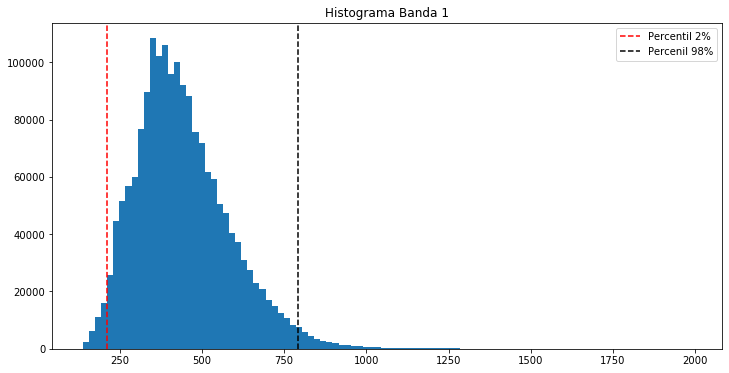

In [107]:
plt.figure(figsize = (12,6))
plt.hist(banda1.ravel(), bins = 100)
plt.axvline(p2_b1, color = 'red' ,linestyle = '--', label = 'Percentil 2%')
plt.axvline(p98_b1, color = 'black' ,linestyle = '--', label = 'Percenil 98%')
plt.legend()
plt.title("Histograma Banda 1")
plt.show()

**Pregunta: ¿Porqué en el comando _plt.hist_ agregamos el operador _.ravel()_ ?**

#### Ahora visualizamos la banda 1 con distintas opciones de escalado:

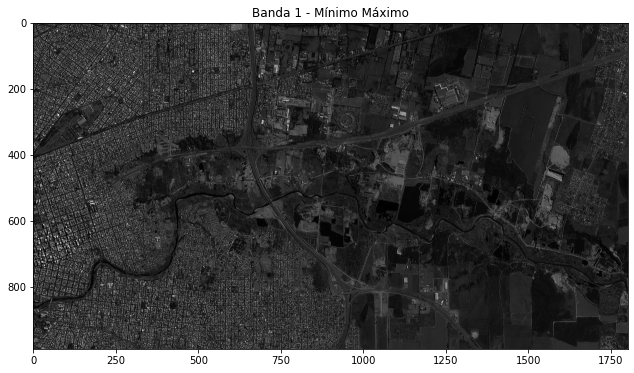

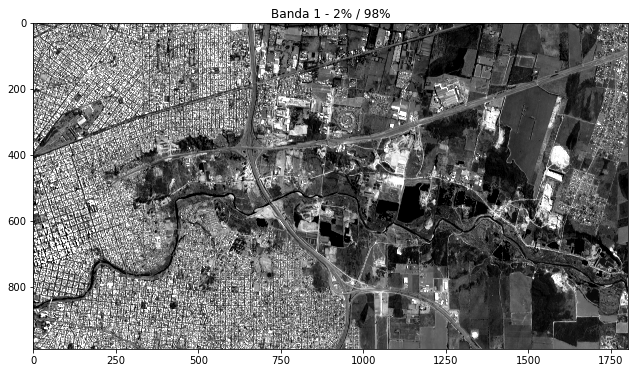

In [110]:
#Estirando al min/max de la imagen
plt.figure(figsize = (12,6))
plt.imshow(banda1, cmap = 'gray', vmin = min_b1, vmax = max_b1)
plt.title("Banda 1 - Mínimo Máximo")
plt.show()

#Estirando al 2% - 98% de la imagen
plt.figure(figsize = (12,6))
plt.title("Banda 1 - 2% / 98%")
plt.imshow(banda1, cmap = 'gray', vmin = p2_b1, vmax = p98_b1)
plt.show()

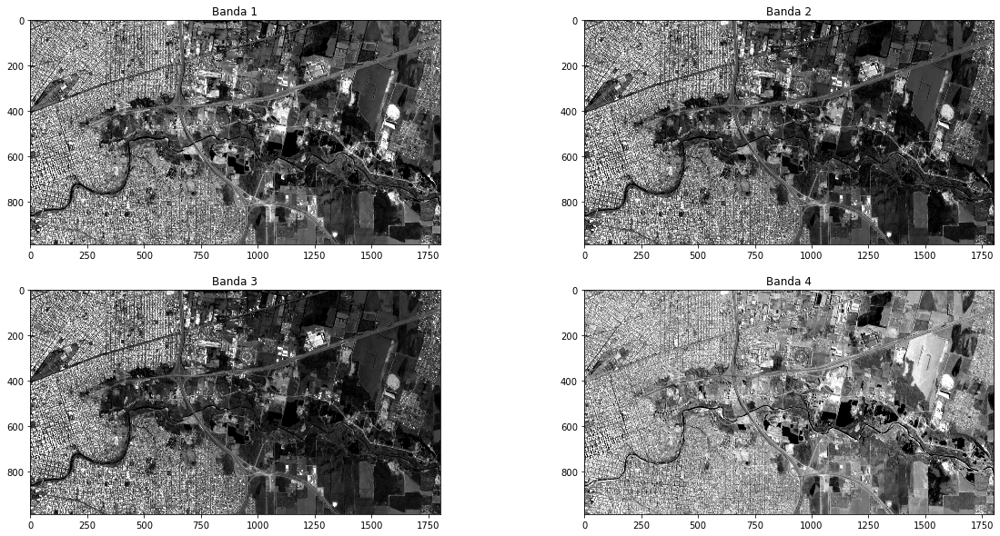

In [108]:
# Con esta celda ploteamos todas las bandas en una misma figura:
# Ejemplo estirando la imagen al percentil 2% - 98%

bandas = spot_apilada.shape[0]
percentil = 2

plt.figure(figsize = (20,10))

for i in range(bandas):
    banda = spot_apilada[i,:,:]
    p1 = np.percentile(banda, percentil)
    p2 = np.percentile(banda, 100 - percentil)
    plt.subplot(2,2,i+1)
    plt.title(f'Banda {i+1}')
    plt.imshow(banda, vmin = p1, vmax = p2, cmap = 'gray')
    
plt.show()
    

#### Ejercicio 1.1:

a) Probar las visualizaciones de cada banda estirando a distintos rangos porcentuales: 80%, 90% y 95%
b) Explorar otras escalas de colores para visualizar cada imagen (hasta ahora venimos usando la escala de grises)

#### Ahora probemos algunas visualizaciones de la imagen en RGB

Cuando hacemos combinaciones RGB, es recomendable escalar primero cada uno de los canales a un mismo rango, para que se puedan visualizar correctamente.

Esto lo podemos hacer escalando al máximo y mínimo de una imagen, o tomando sus percentiles como venimos haciendo.
Veamos primero que pasa si no aplicamos ningún escalado:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


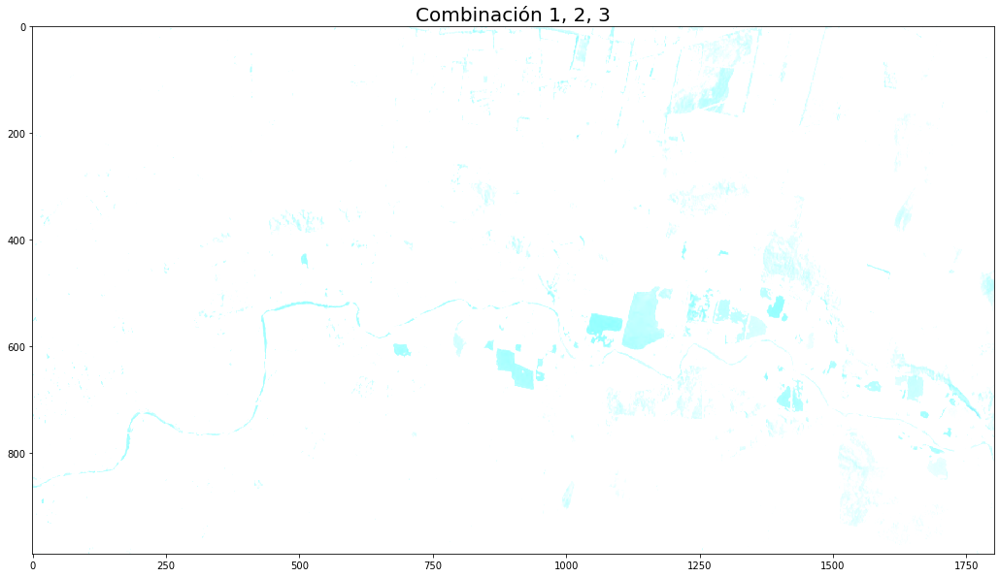

In [117]:
#Elegimos las bandas con las que queremos trabajar 
r = 1
g = 2
b = 3

# Escalamos las bandas entre 0 y 1 para que sea más fácil su visualización
# Recordar las indexaciones en Python!!, por eso le restamos 1 a cada número de banda!
r1 = spot_apilada[r-1,:,:]
g1 = spot_apilada[g-1,:,:]
b1 = spot_apilada[b-1,:,:]

a = np.dstack((r1,g1,b1))

plt.figure(figsize = (20,10))
plt.title(f'Combinación {r}, {g}, {b}', size = 20)
plt.imshow(a)
plt.show()

La imagen se ve muy saturada. ¿Por qué sucede esto?

A continuación, probamos escalando al mínimo y máximo de cada banda:

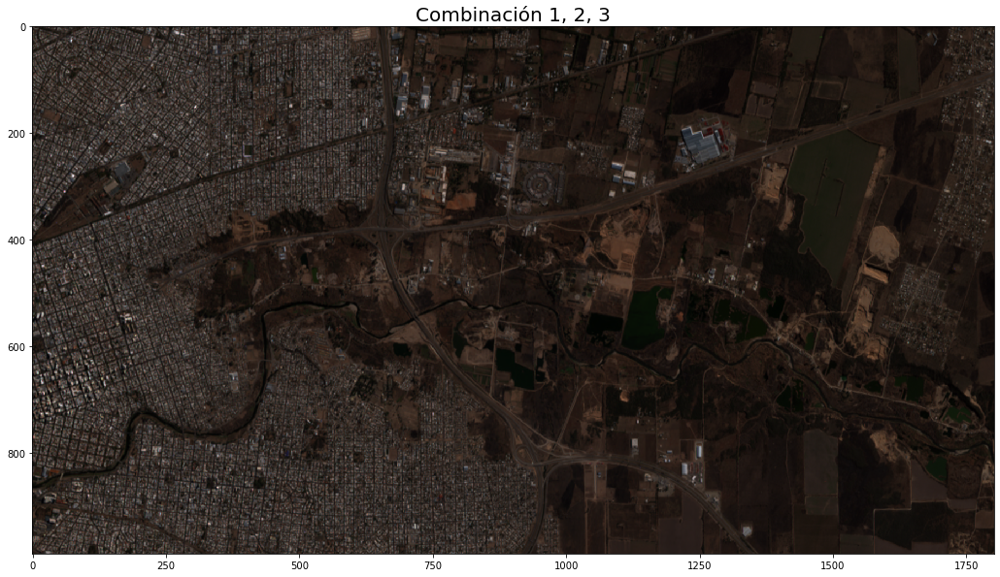

In [113]:
# Esta función escala una matriz al máximo y mímino

def scale(array):
    array_min, array_max = array.min(), array.max()
    return ((array - array_min)/(array_max - array_min))

#Elegimos las bandas con las que queremos trabajar 
r = 1
g = 2
b = 3

# Escalamos las bandas entre 0 y 1 para que sea más fácil su visualización
# Recordar las indexaciones en Python!!, por eso le restamos 1 a cada número de banda!
r1 = scale(spot_apilada[r-1,:,:])
g1 = scale(spot_apilada[g-1,:,:])
b1 = scale(spot_apilada[b-1,:,:])

a = np.dstack((r1,g1,b1))

plt.figure(figsize = (20,10))
plt.title(f'Combinación {r}, {g}, {b}', size = 20)
plt.imshow(a)
plt.show()

In [ ]:
La imagen anterior se ve mejor, pero se ve muy oscura, con poco contraste.  Veamos cómo podemos mejorarla

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


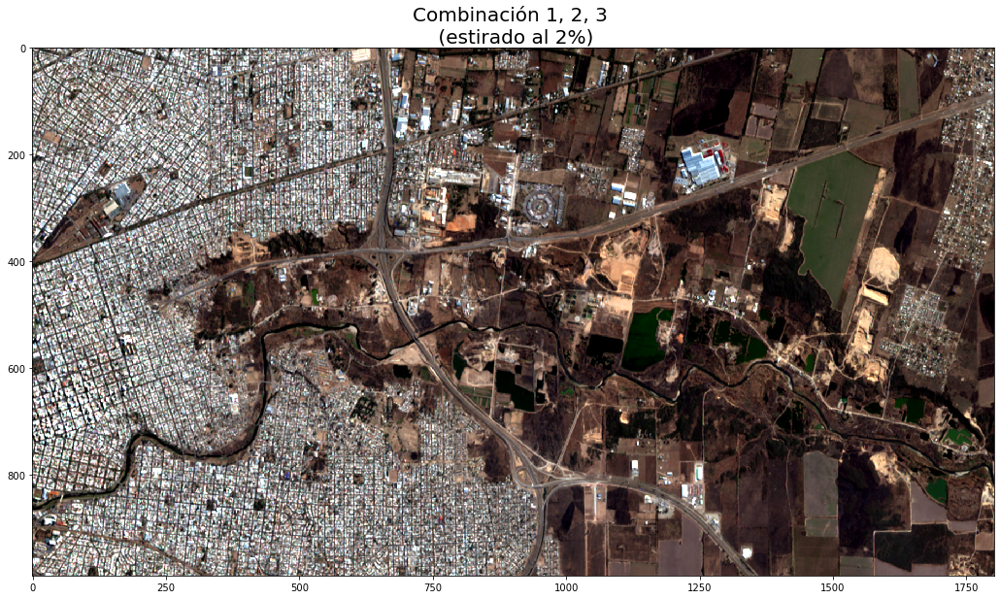

In [118]:
# Esta función escala o estira la imagen a determinado % del histograma (trabaja con percentiles)
def scalep(array,p):
    array_min, array_max = np.percentile(array,p), np.percentile(array,100-p)
    return ((array - array_min)/(array_max - array_min))


r = 1
g = 2
b = 3

#Escalamos las bandas a un % determinado
p = 2
r1 = scalep(spot_apilada[r-1,:,:],p)
g1 = scalep(spot_apilada[g-1,:,:],p)
b1 = scalep(spot_apilada[b-1,:,:],p)


a = np.dstack((r1,g1,b1))

plt.figure(figsize = (20,10))
plt.title(f'Combinación {r}, {g}, {b} \n (estirado al {p}%)' , size = 20)
plt.imshow(a)
plt.show()

#### Ejercicio 1.2:

a) Probar otras combinaciones y estiramiento de la imagen usando otros percentiles,y analizar cómo cambia la visualización

b) Extra: ¿Cómo impacta en el histograma de la imagen cada uno de los escalados realizados? ¿Se animan a plotearlos y compararlos con su histograma original?

**Extra 2:** ¿Qué les parece si en lugar de configurar manualmente las bandas y percentil que queremos usar cada vez que queremos plotear un RGB, no armamos una función que podamos re-utilizar en otros momentos? La celda de abajo propone un ejemplo.

In [164]:
def plot_rgb(array,band_list, p = None, figsize = (12,6)):
    '''
    Esta función toma como parámetros de entrada la matriz a ser ploteada, una lista de índices correspondientes
    a las bandas que queremos usar, en el orden que deben estar (ej: [1,2,3]), y un parámetro
    p que es opcional, y se refiere al porcentaje al cual se desea estirar la imagen. Si p no tiene valor
    esta función llama a scale, si p toma algún otro valor, llama a scalep.
    
    Por defecto tambien asigna un tamaño de figura en (12,6), que también puede ser modificado.
    
    Devuelve solamente un ploteo, no modifica el arreglo original, y luego borra las variables creadas para
    liberar memoria.
    '''
    r = band_list[0]
    g = band_list[1]
    b = band_list[2]
    
    if p:
        r1 = scalep(array[r-1,:,:],p)
        g1 = scalep(array[g-1,:,:],p)
        b1 = scalep(array[b-1,:,:],p)
    else:
        r1 = scale(array[r-1,:,:],p)
        g1 = scale(array[g-1,:,:],p)
        b1 = scale(array[b-1,:,:],p)
        
    a = np.dstack((r1,g1,b1))
    
    plt.figure(figsize = figsize)
    plt.title(f'Combinación {r}, {g}, {b} \n (estirado al {p}%)' , size = 20)
    plt.imshow(a)
    plt.show()
    
    del a,r,g,b,r1,g1,b1

### 2) Operaciones básicas: Recortes y álgebra de bandas

Ahora que hemos leido nuestra imagen y hemos logrado visualizarla, realizaremos algunas operaciones básicas.

1) En primer lugar haremos algunos recortes simples sobre la misma  
2) Luego, realizaremos operaciones entre las bandas, como la obtención de índices, y veremos como guardar los resultados a un nuevo archivo.

#### Recortes simples sobre la imagen

En esta clase aprenderemos como obtener recortes (subsets) rectangulares de la imagen, haciendo uso del _slicing_ que nos ofrece Numpy. Cuando hagamos la Clase 4, veremos que hay formas más adecuadas para los datos geoespaciales, utilizando archivos vectoriales externos con georreferenciación. Supongamos que queremos recortar la imagen aproximadamente al área demarcada en la SPOT:

<!-- ![spotRecorte.png](attachment:spotRecorte.png) -->

<p align="left">
 <img src="../images/spotRecorte.png" width="500" >
</p>

Dicho sector va (aproximadamente) de la columna 750 a la 1500, y de la fila 200 hasta la 800. Sobre la variable _spot_apilada_ aplicaremos el subset, teniendo cuidado de la indexación en Python (recuerden que siempre inicia desde 0 a la hora de hacer el _slicing_).

In [258]:
spot_apilada_rec = spot_apilada[:,199:799,749:1499]
spot_apilada_rec.shape

(4, 600, 750)

#### La nueva matriz recortada parece tener las dimensiones correctas. Visualicemos el resultado del recorte en RGB con _matplotlib_ (usamos la función que definimos al final de la otra sección):

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


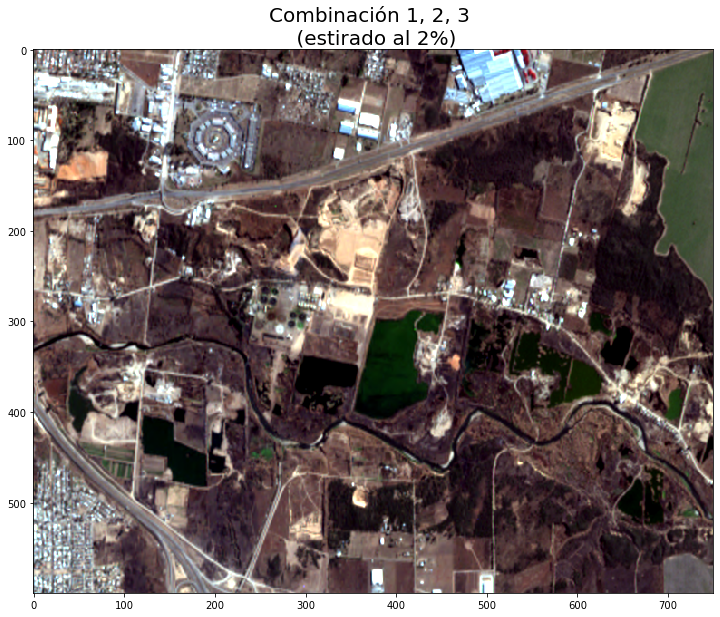

In [204]:
plot_rgb(spot_apilada_rec, [1,2,3], p=2, figsize = (20,10) )

#### Ejercicio 2.1: 

Realizar recortes de otra/s zonas para ejercitar. Pueden probar distintos tipos de superficies, pues en esta imagen tenemos paisajes muy heterogéneos.

Construyan los histogramas para esos recortes y compárenlos con la imagen completa, para todas o alguna de las bandas de la imagen. Esto les servirá para familiarizarse con actividades que haremos en la Clase 4.

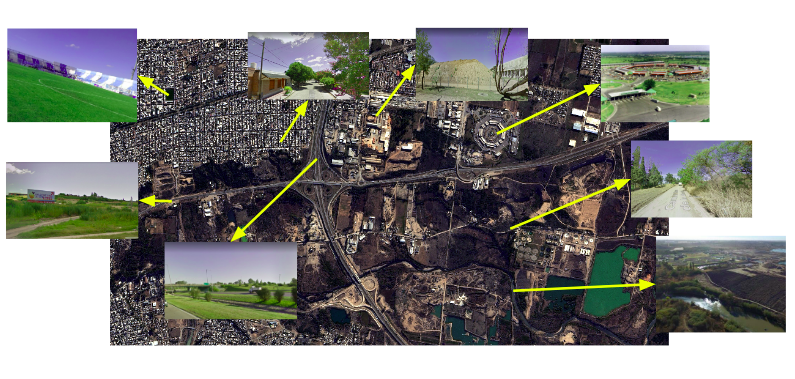

#### Álgebra de bandas

A continuación vamos a hacer algunas operaciones con las bandas del recorte realizado (nuestra variable **spot_apilada_rec**) para obtener nuevos productos. Al ser arreglos de Numpy, se pueden realizar operaciones matemáticas con la mismas y entre ellas también (sumarlas, multiplacarlas, restarlas, dividirlas, normalizarlas por una constante, etc). 

Aprovecharemos estas capacidades para calcular dos índices normalizados que de gran uso en la Teledetección Óptica: El Índice de Vegetación Normalizado (o _NDVI_ por sus siglas en inglés), y el Índice de Agua Normalizado (o _NDWI_ por sus siglas en inglés), que trabajarán ustedes en un ejercicio:

$ NDVI = \frac{NIR - R}{NIR + R} $  

Donde $NIR$ se refiere a la banda del Infrarrojo Cercano, y $R$ se refiere a la banda del Rojo (¿Cuáles serían en nuestra SPOT?).

In [191]:
#Tip: Matplotlib permite abrir los gráficos en una nueva ventana interactiva.
# En el caso de imshow() puede ser interesante para consultar los valores de los píxeles.

#Descomentar la siguiente línea:
# %matplotlib qt

#Si se quiere volver a los ploteos dentro de la celda, correr la siguiente línea:
# %matplotlib inline

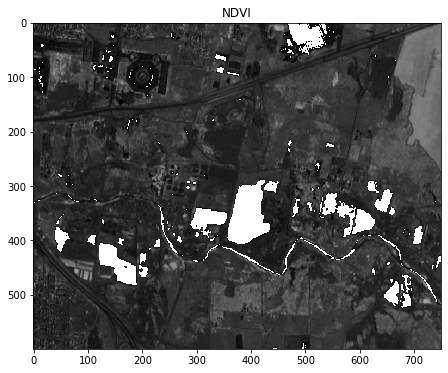

In [206]:
#Cálculo  y visualización del NDVI

# Tip: Se pueden consultar distintas paletas de color de matplotlib aquí: https://matplotlib.org/stable/tutorials/colors/colormaps.html

b_nir = spot_apilada_rec[3,:,:]
b_red = spot_apilada_rec[0,:,:]

ndvi = (b_nir - b_red) / (b_nir + b_red)

plt.figure(figsize = (12,6))
plt.imshow(ndvi, vmin = 0, vmax = 1, cmap = 'gray')
plt.title("NDVI")
plt.show()

**El NDVI calculado tiene valores muy altos en píxeles que corresponden al agua, incluso a techos de estructuras artificiales. ¿Por qué sucede esto?**

Consultemos el valor de uno de esos píxeles. Por ejemplo, el que tiene coordenadas (fila, columna) 350,400

In [207]:
print(ndvi[350,400])

216.01650165016503


Ahora veamos los valores que tienen la banda NIR y RED en ese mismo pixel

In [215]:
print(b_nir[350,400])
print(b_red[350,400])

110
193


**Con estos valores, nuestro NDVI en ese pixel debería ser (110-193) / (110+190) = -0.274**

Cuando operamos con arreglos de numpy en Python, a veces es necesario indicar explícitamente que sean tratados como números flotantes, de manera tal que el resultado de operar entre ellos también sea flotante. Lo arreglamos usando el método **astype()**

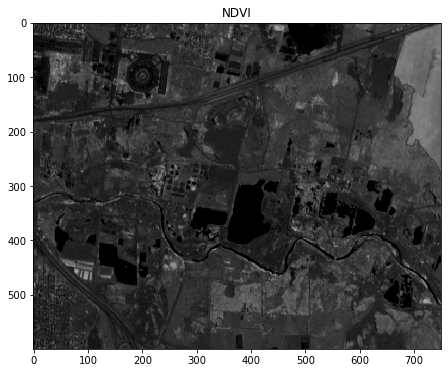

In [217]:
b_nir = spot_apilada_rec[3,:,:].astype(float)
b_red = spot_apilada_rec[0,:,:].astype(float)

ndvi = (b_nir - b_red) / (b_nir + b_red)

plt.figure(figsize = (12,6))
plt.imshow(ndvi, vmin = 0, vmax = 1, cmap = 'gray')
plt.title("NDVI")
plt.show()

**Esto ahora parece ser más coherente, probemos con otra paleta de color**

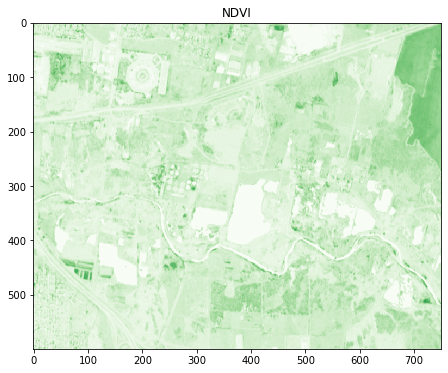

In [223]:
plt.figure(figsize = (12,6))
plt.imshow(ndvi, vmin = 0, vmax = 1, cmap = 'Greens')
plt.title("NDVI")
plt.show()

#### Ejercicio 2.2:

Repetir los pasos realizados con el NDVI, para calcular el Ìndice Normalizado de Agua (o NDWI) según la siguiente fórmula:

$ NDWI = \frac{G - NIR}{G + NIR} $ 

Donde $ G $ corresponde a la banda del verde, y $NIR$ es la misma que utilizamos para el NDVI

**Nota**: La fórmula propuesta para el NDWI corresponde a la formulación de [Mc. Feeters (1996)](https://hess.copernicus.org/articles/22/4349/2018/hess-22-4349-2018-t01.pdf)

### 3) Escritura de archivos recortados

Ahora que tenemos recortados nuestros archivos y que hemos generado algunos productos nuevos, veamos como guardarlos en nuestro equipo. 

Hay algunas cuestiones a considerar, como ser:

- La proyección de nuestro archivo, que capturamos al principio de la notebook en la variable _src_
- En qué formato vamos a querer guardar nuestro raster
- El tipo de dato del archivo que queremos guardar (principalmente si será un raster con números enteros o flotantes).
- Las **dimensiones** del archivo que queremos guardar: Recordar que ahora estamos almacenando un recorte de nuestra imagen orginal.
- La geotransformación o _geotransform_ , que hemos leido al principio de la notebook en la variable _gt_ ,pero que ahora deberemos adaptar a nuestro recorte.

Empecemos por revisar este último parámetro

In [225]:
print(gt)

(388865.786, 5.998628912319642, 0.0, 6528057.4835, 0.0, -6.002995449949821)


¿Qué es cada uno de los parámetros que contiene el GeoTransform? Repasemos:

1) La coordenada superior izquierda en el eje X
2) Ancho del pixel en X (Este-Oeste)
3) La rotación de las filas (normalmente esta es 0)
4) La coordenada superior izquierda en el eje Y
5) La rotación de las columnas (normalmente esta es 0)
6) Ancho del pixel en Y (Norte-Sur): En el caso de las imágenes que trabajamos nostros, que apuntan hacia el norte, este siempre toma un valor negativo.

Nuestro recorte comparte casi todos los atributos del parámetro _Geotransform()_ con la imagen original, excepto el 1) y el 4). Efectivamente, la esquina superior izquierda de nuestro recorte no es el mismo, y de alguna manera tenemos que poder recalcularlas.

Nosotros hicimos el recorte de la SPOT con el siguiente código:

    spot_apilada[:,199:799,749:1499]

Es decir que la esquina superior izquierda estaría ubicada en la fila 199, columna 749:

<p align="left">
 <img src="../images/recorteUL.png" width="500" >
</p>

Sabiendo eso, podemos calcular el desplazamiento en coordenadas que necesitamos para llegar a nuestro nuevo punto superior izquierdo. En el caso de la coordenada X, debemos tomar el índice columnas (749) y el ancho del pixel en X, y sumarle la coordenada original:

In [312]:
gt[1]*749 + gt[0]

393358.75905532745

En el caso de Y, debemos proceder de manera similar, con el índice de filas (199) y el ancho del pixel en Y (respetando su signo!!!):

In [313]:
gt[5]*199 + gt[3]

6526862.88740546

Ahora podemos crearnos nuestro nuevo _Geotransform()_ para el recorte, porque ya conocemos las coordenadas de su esquina superior izquierda. Como **gt** es una tupla, podemos re-armarla manualmente siempre y cuando respetemos el orden y la estructura original. Reutilizaremos todos los elementos de **gt** , salvo los que hemos calculado, y con es construiremos una variable nueva que se llame **gt_recorte**:

In [314]:
ulx = gt[1]*749 + gt[0]
uly = gt[5]*199 + gt[3]

gt_recorte = (ulx, gt[1], gt[2], uly, gt[4], gt[5])

print(gt_recorte)

(393358.75905532745, 5.998628912319642, 0.0, 6526862.88740546, 0.0, -6.002995449949821)


Otra propiedad que debemos especificar es el Sistema de Coordenadas del raster que almacenaremos. Para facilitar las cosas, seguiremos usando el mismo de la imagen original, que fue leido al principio de la notebook como **src**:

In [315]:
src

'PROJCS["WGS 84 / UTM zone 20S",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-63],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",10000000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32720"]]'

A continuación, veamos las dimensiones (filas y columnas) de nuestro recorte. Esto lo podemos obtener con el método _.shape()_ y guardarlo a variables:

In [316]:
print('Dimensiones del recorte:', spot_apilada_rec.shape)

filas = spot_apilada_rec.shape[1]
columnas = spot_apilada_rec.shape[2]

print('Filas, Columnas:', filas, columnas)

Dimensiones del recorte: (4, 600, 750)
Filas, Columnas: 600 750


También debemos saber en qué formato querremos nuestra imagen de salida. En la librería GDAL esto se conoce como _driver_. GDAL trabaja con una gran variedad de Drivers que pueden consultarse [aquí](https://gdal.org/drivers/raster/index.html). Nosotros en particular trabajaremos con GeoTiff, y la forma de indicarle a GDAL que queremos ese formato es con el método _GetDriverByName()_: 

In [317]:
driver = gdal.GetDriverByName('GTiff')

driver

<osgeo.gdal.Driver; proxy of <Swig Object of type 'GDALDriverShadow *' at 0x7fa530edcbd0> >

Por último, nos queda elegir el tipo de dato que queremos para nuestros píxeles. GDAL define codificaciones para los distintos tipos de datos. Algunos de los más usados se listan a continuación:

- GDT_CFloat32: Dato complejo flotante de 32 bits
- GDT_CFloat64: Dato complejo flotante de 64 bits
- GDT_CInt16: Dato complejo entero de 16 bits
- GDT_CInt32: Dato complejo entero de 32 bits
- GDT_Float32: Dato flotante de 32 bits
- GDT_Float64: Dato flotante de 64 bits
- GDT_Int16: Dato entero de 16 bits (con signo, admite positivos y negativos)
- GDT_Int32: Dato entero de 32 bits (con signo, admite positivos y negativos)
- GDT_Byte: Dato entero natural de 8 bits
- GDT_UInt16: Dato entero de 16 bits (sin signo, solo positivos)
- GDT_UInt32: Dato entero de 32 bits (sin signo, solo positivos)

Si abrimos por ejemplo la imagen SPOT en QGIS, o simplemente ploteamos sus valores, veremos que se tratan de enteros. De hecho , al mirar las propiedades del raster en QGIS, constatamos que el tipo de dato es **UInt16**:

<p align="left">
 <img src="../images/spotInt.png">
</p>

**Por lo tanto, a GDAL le indicaremos que trabajamos con GDT_UInt16 **

La siguiente celda combina todo los parámetros que creamos o calculamos y escribe el raster de salida. Vamos a guardar la matriz **spot_apilada_rec** como archivo geotiff, conservando sus 4 bandas:~

In [318]:
bandas = 4 
imagen_salida = driver.Create('spot_apilada_rec.tif', columnas, filas, bandas, gdal.GDT_UInt16)

Esto crea simplemente un archivo vacio, en este caso en el directorio de nuestra Notebook, al que deberemos cargarle datos. La estructura genérica de esta orden se resumen en la siguiente imagen de ejemplo:

<p align="left">
 <img src="../images/driverCreate.png">
</p>

Ahora, le asignamos el sistema de coordenadas y el GeoTransform a **imagen_salida**:

In [319]:
imagen_salida.SetProjection(src)
imagen_salida.SetGeoTransform(gt_recorte)

#Corroboramos  que se haya asignado correctamente
imagen_salida.GetGeoTransform()

(393358.75905532745,
 5.998628912319642,
 0.0,
 6526862.88740546,
 0.0,
 -6.002995449949821)

Ahora tomamos cada una de las bandas de nuestro archivo de salida, y le "cargamos" cada una de las bandas de **spot_apilada_rec**:

In [320]:
#Banda 1
imagen_salida.GetRasterBand(1).WriteArray(spot_apilada_rec[0,:,:])
#Banda 2
imagen_salida.GetRasterBand(2).WriteArray(spot_apilada_rec[1,:,:])
#Banda 3
imagen_salida.GetRasterBand(3).WriteArray(spot_apilada_rec[2,:,:])
#Banda 4
imagen_salida.GetRasterBand(4).WriteArray(spot_apilada_rec[3,:,:])



0

In [321]:
#Liberamos el archivo con el comando del. De esa forma se termina de escribir.

del imagen_salida

#### Ejercicio 3.1

Repetir los pasos para la escritura del recorte, con los índices NDVI y NDWI calculados en la sección anterior.
Probar dos alternativas:

a) Guardar cada uno de los índices como archivos separados. Nombralos como **spot_apilada_rec_ndvi.tif** y **spot_apilada_rec_ndwi.tif** respectivamente.

b) Generar un raster que contenga las 4 bandas multiespectrales, el NDVI y el NDWI (en ese orden), y nombrarlo como **spot_apilada_rec_indices**

**Nota**: Prestar atención al tipo de dato que se debe usar para los píxeles del NDVI y el NDWI